

```
# This is formatted as code
```

# Style-GAN generator

Loads a pretrained Style-GAN2 generator in pytorch so that we can run tests for the geometric toolkit project.

This code is based on https://github.com/rosinality/stylegan2-pytorch and also the ILO code of Daras et al.

In [40]:
%load_ext autoreload
%autoreload 2
import cv2
import torch
import torch.optim as optim
from torchvision import utils
import ipywidgets as widgets
import glob
import matplotlib.pyplot as plt
from ipywidgets import Layout
from PIL import Image
import numpy as np
from stylegan import load_generator, model_decode, get_graddir, get_loss
from geom_utils import compute_jacobian, show_img, load_obama
import math

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [41]:
torch.cuda.is_available()

True

# Basic utilities: loading Obama, showing images, etc...

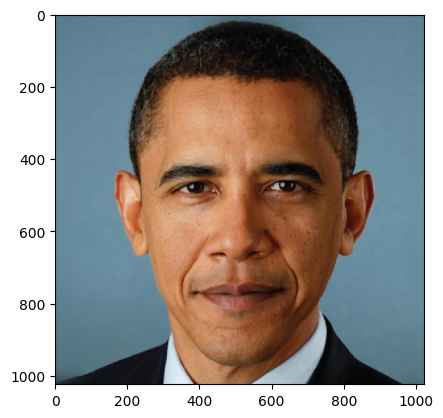

In [42]:
show_img(load_obama())

## Generate and show random images

In [43]:
# This code loads the generator. It may take a couple of minutes to run.
g_ema, args, mean_latent = load_generator()

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99


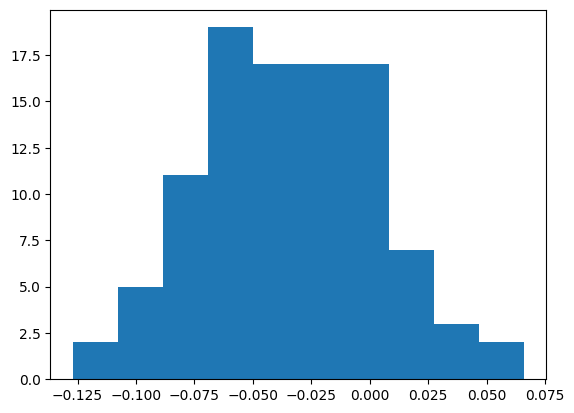

In [44]:
## Histogram of dot products of nabla (g(z) - g(z1))^2|_{z = z0} for random z0, z1
latent_d = args.latent
numtrials = 1
dotprods = []
for i in range(100):
  print(i)
  z0 = torch.randn([numtrials, latent_d]).to(device)
  z1 = torch.randn([numtrials, latent_d]).to(device)
  graddir = get_graddir(g_ema, z0,z1, args.truncation, mean_latent)
  movedir = z1 - z0
  graddir = graddir / torch.norm(graddir)
  movedir = movedir / torch.norm(movedir)
  # print(graddir.shape)
  # print(movedir.shape)
  dotprods.extend([x for x in torch.sum(graddir * movedir,1).detach().cpu()])
plt.hist(np.asarray(dotprods))
plt.show()

0
0


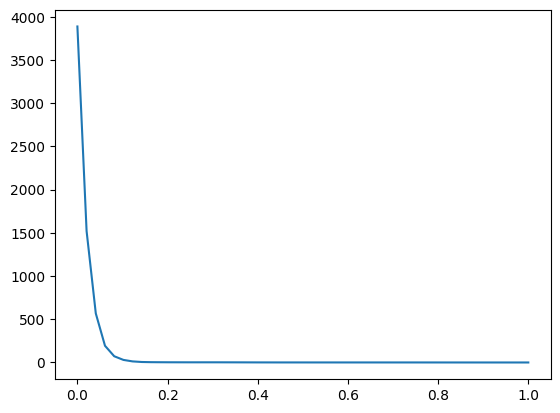

In [45]:
batch_size = 1
discretization = 50
dotprods = []
with torch.no_grad():
  for i in range(1):
    print(i)
    currlosses = []
    z0 = torch.randn([batch_size, latent_d]).to(device)
    z1 = torch.randn([batch_size, latent_d]).to(device)
    delta = z1 - z0
    for j in range(discretization):
      if j % 100 == 0:
        print(j)
      currz = z0 + delta * j / (discretization-1)
      currlosses.append(get_loss(g_ema,currz,z1, args.truncation, mean_latent).cpu())
    plt.plot(np.linspace(0,1,discretization),np.asarray(currlosses))
    plt.show()

0
0


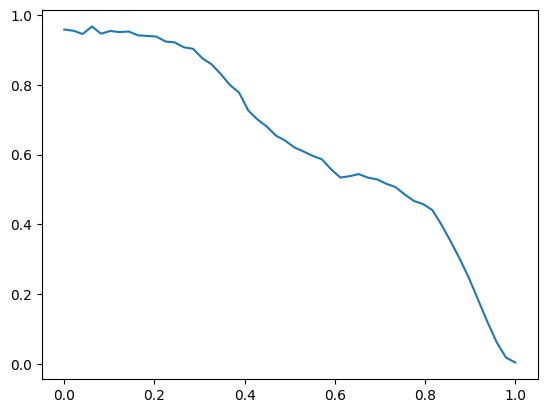

In [46]:
# Loss curve monotonicity during interpolation?

batch_size = 1
discretization = 50
dotprods = []
with torch.no_grad():

  z1 = torch.randn([batch_size, latent_d]).to(device)
  for i in range(1):
    print(i)
    currlosses = []
    z0 = torch.randn([batch_size, latent_d]).to(device)
    delta = z1 - z0
    for j in range(discretization):
      t = j / (discretization-1)
      if j % 100 == 0:
        print(j)
      # currz = z0 * math.sqrt(1 - t**2) + z1 * t
      currz = z0 + t * delta
      currlosses.append(get_loss(g_ema,currz,z1, args.truncation, mean_latent).cpu())
    plt.plot(np.linspace(0,1,discretization),np.asarray(currlosses))
  plt.show()

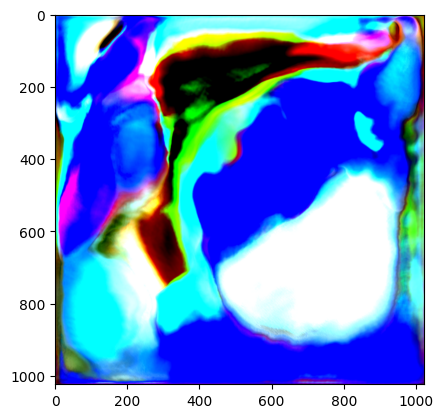

step 0
g(z1) - g(z) tensor(28.4106, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0., device='cuda:0')
z1 - z tensor(1.9152, device='cuda:0')


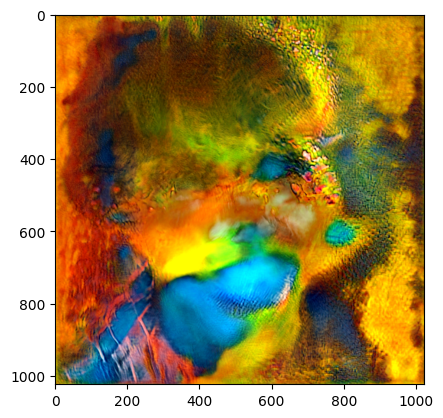

step 20
g(z1) - g(z) tensor(28.3552, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(3.4653e-06, device='cuda:0')
z1 - z tensor(1.9155, device='cuda:0')


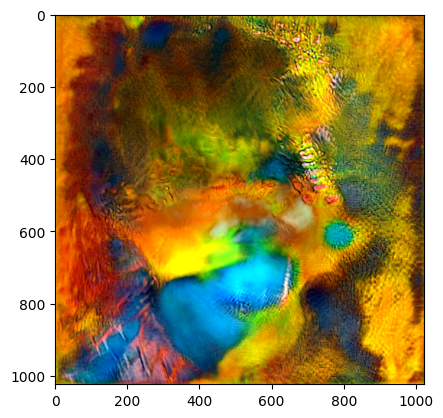

step 40
g(z1) - g(z) tensor(28.2626, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(1.4001e-05, device='cuda:0')
z1 - z tensor(1.9158, device='cuda:0')


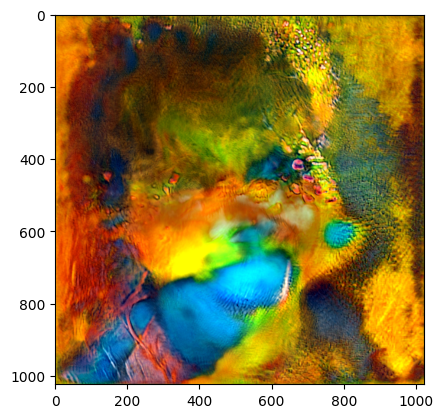

step 60
g(z1) - g(z) tensor(28.1634, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(3.1650e-05, device='cuda:0')
z1 - z tensor(1.9161, device='cuda:0')


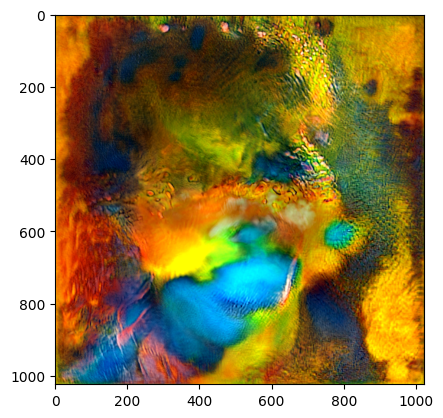

step 80
g(z1) - g(z) tensor(28.0341, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(5.6951e-05, device='cuda:0')
z1 - z tensor(1.9164, device='cuda:0')


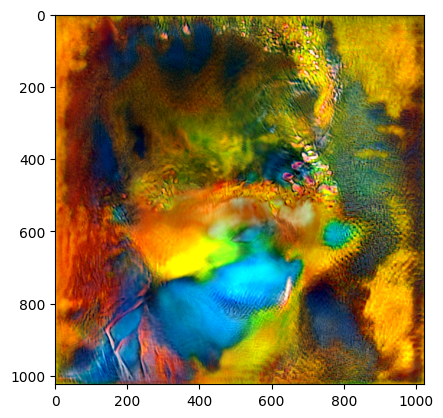

step 100
g(z1) - g(z) tensor(27.9041, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(9.0478e-05, device='cuda:0')
z1 - z tensor(1.9166, device='cuda:0')


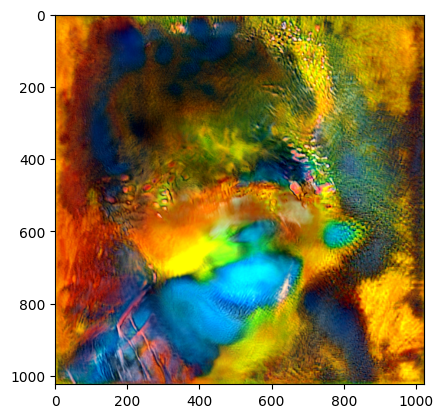

step 120
g(z1) - g(z) tensor(27.7731, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0001, device='cuda:0')
z1 - z tensor(1.9168, device='cuda:0')


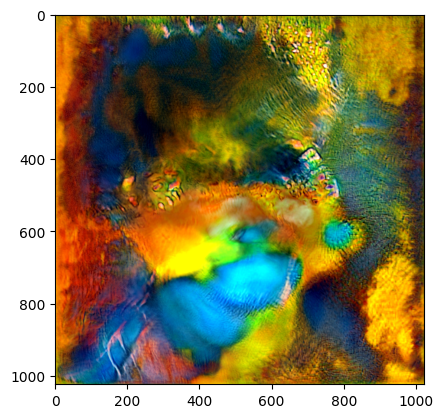

step 140
g(z1) - g(z) tensor(27.6161, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0002, device='cuda:0')
z1 - z tensor(1.9170, device='cuda:0')


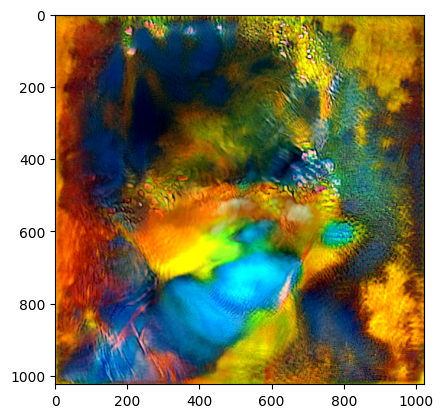

step 160
g(z1) - g(z) tensor(27.5203, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0002, device='cuda:0')
z1 - z tensor(1.9172, device='cuda:0')


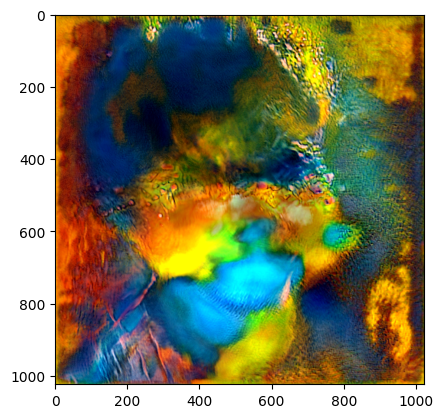

step 180
g(z1) - g(z) tensor(27.2675, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0003, device='cuda:0')
z1 - z tensor(1.9174, device='cuda:0')


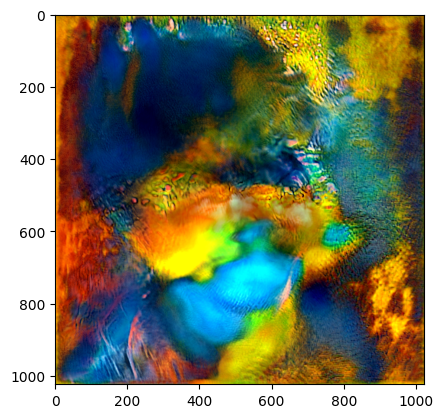

step 200
g(z1) - g(z) tensor(27.0259, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0004, device='cuda:0')
z1 - z tensor(1.9175, device='cuda:0')


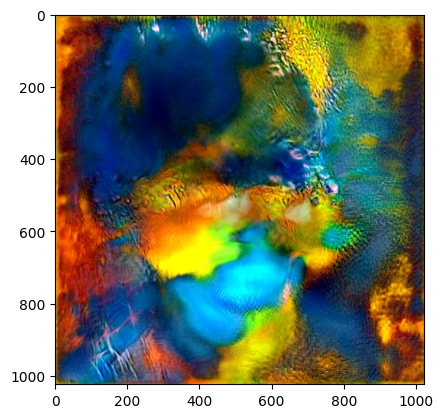

step 220
g(z1) - g(z) tensor(26.8080, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0005, device='cuda:0')
z1 - z tensor(1.9176, device='cuda:0')


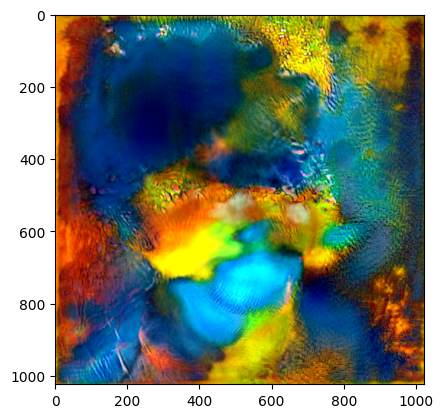

step 240
g(z1) - g(z) tensor(26.4894, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0006, device='cuda:0')
z1 - z tensor(1.9176, device='cuda:0')


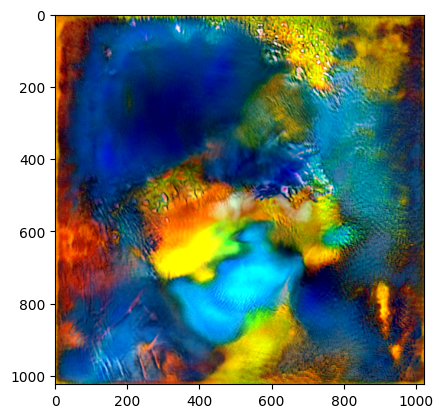

step 260
g(z1) - g(z) tensor(26.2098, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0007, device='cuda:0')
z1 - z tensor(1.9176, device='cuda:0')


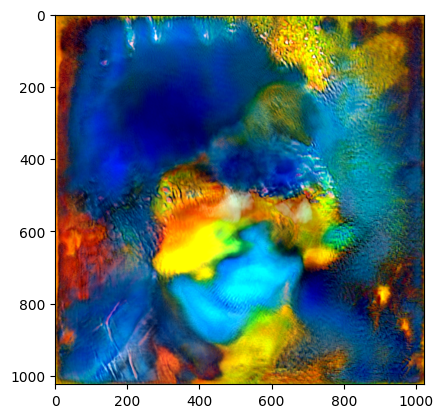

step 280
g(z1) - g(z) tensor(25.9817, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0008, device='cuda:0')
z1 - z tensor(1.9175, device='cuda:0')


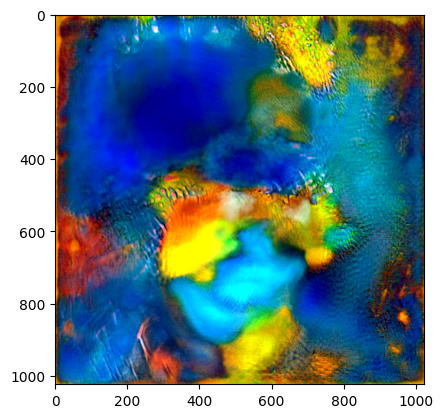

step 300
g(z1) - g(z) tensor(25.5261, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0010, device='cuda:0')
z1 - z tensor(1.9175, device='cuda:0')


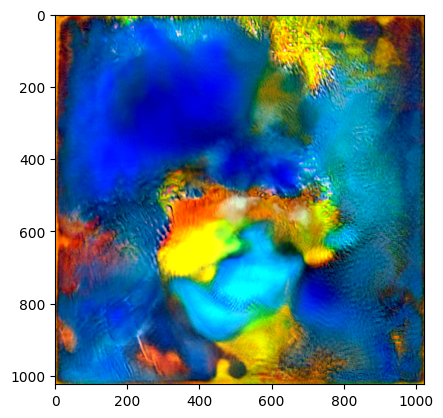

step 320
g(z1) - g(z) tensor(25.2555, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0011, device='cuda:0')
z1 - z tensor(1.9173, device='cuda:0')


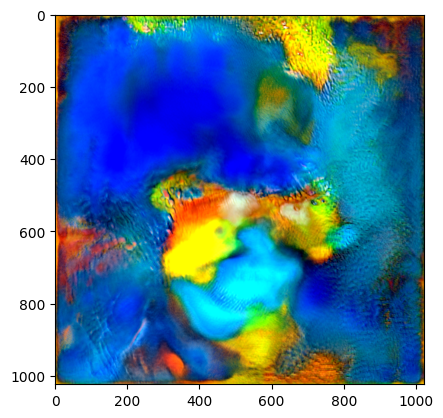

step 340
g(z1) - g(z) tensor(24.9042, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0012, device='cuda:0')
z1 - z tensor(1.9172, device='cuda:0')


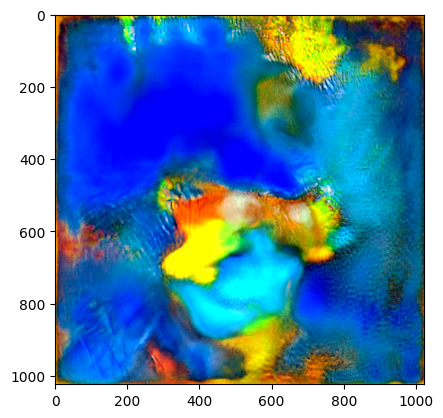

step 360
g(z1) - g(z) tensor(24.5891, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0014, device='cuda:0')
z1 - z tensor(1.9170, device='cuda:0')


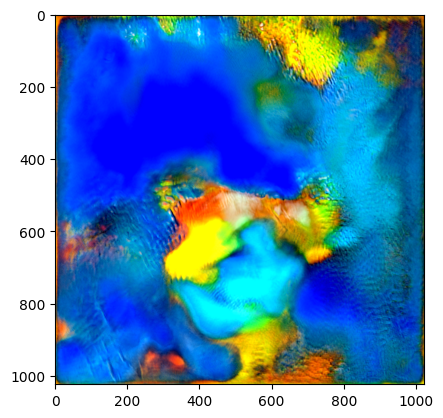

step 380
g(z1) - g(z) tensor(24.2647, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0015, device='cuda:0')
z1 - z tensor(1.9168, device='cuda:0')


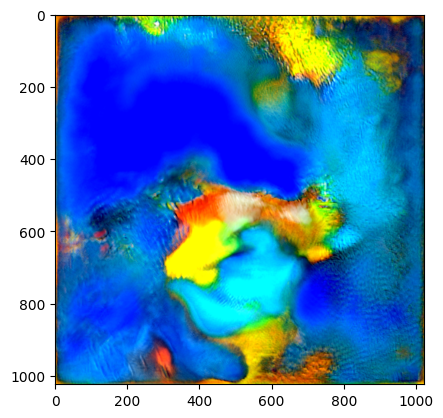

step 400
g(z1) - g(z) tensor(23.9584, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0016, device='cuda:0')
z1 - z tensor(1.9166, device='cuda:0')


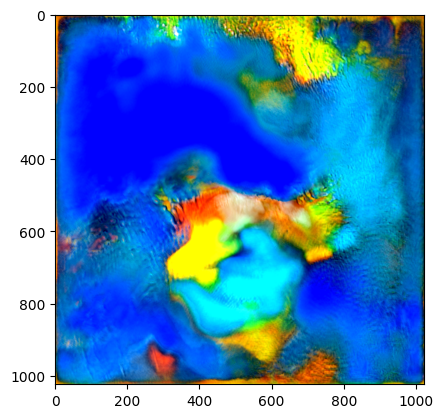

step 420
g(z1) - g(z) tensor(23.7801, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0017, device='cuda:0')
z1 - z tensor(1.9165, device='cuda:0')


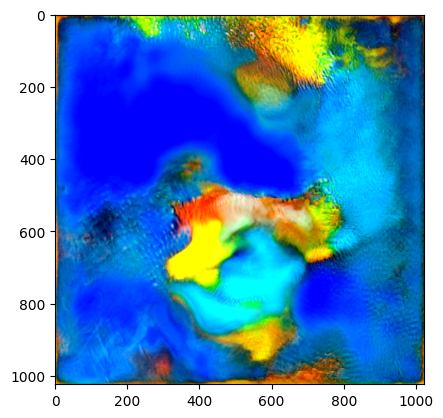

step 440
g(z1) - g(z) tensor(23.5048, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0018, device='cuda:0')
z1 - z tensor(1.9164, device='cuda:0')


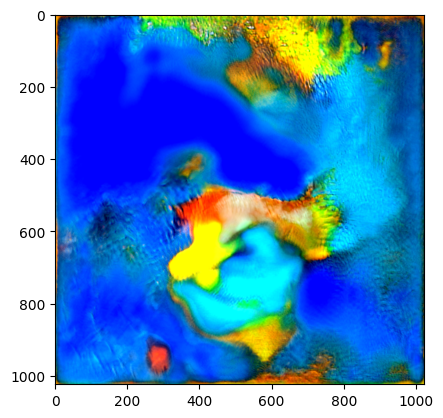

step 460
g(z1) - g(z) tensor(23.1610, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0020, device='cuda:0')
z1 - z tensor(1.9163, device='cuda:0')


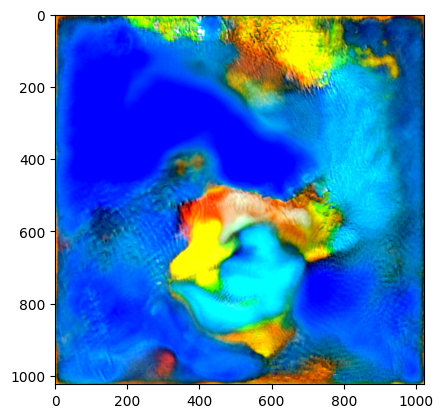

step 480
g(z1) - g(z) tensor(22.7710, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0021, device='cuda:0')
z1 - z tensor(1.9162, device='cuda:0')


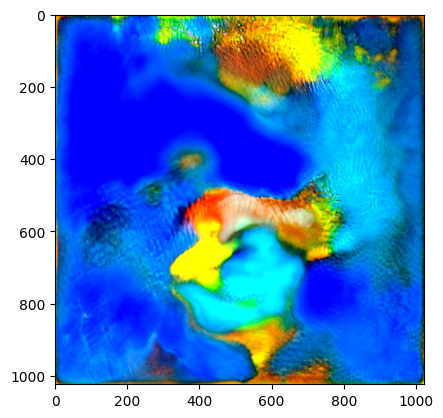

step 500
g(z1) - g(z) tensor(22.5292, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0022, device='cuda:0')
z1 - z tensor(1.9161, device='cuda:0')


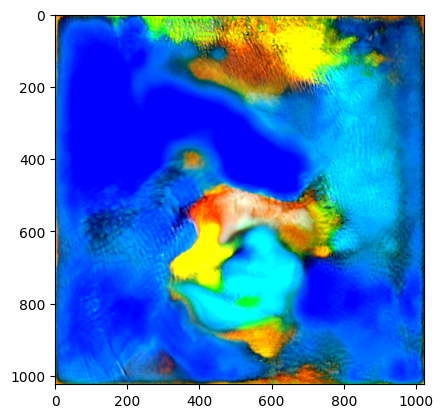

step 520
g(z1) - g(z) tensor(22.2475, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0024, device='cuda:0')
z1 - z tensor(1.9159, device='cuda:0')


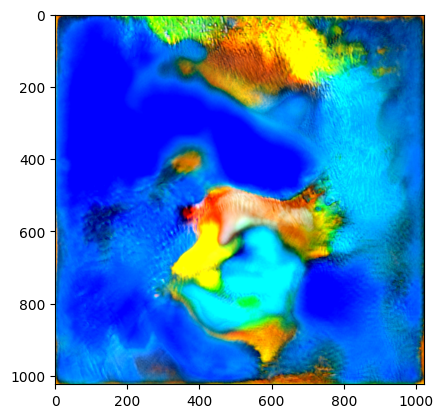

step 540
g(z1) - g(z) tensor(21.9524, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0025, device='cuda:0')
z1 - z tensor(1.9157, device='cuda:0')


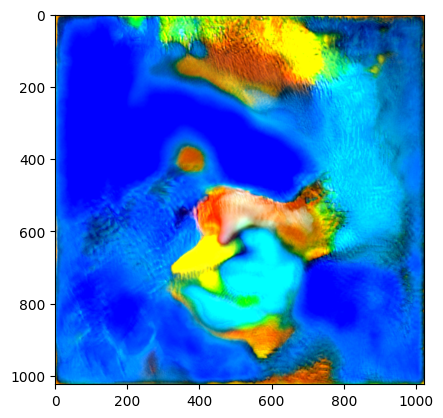

step 560
g(z1) - g(z) tensor(21.6540, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0027, device='cuda:0')
z1 - z tensor(1.9154, device='cuda:0')


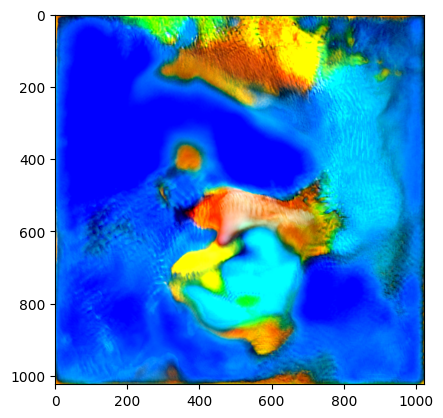

step 580
g(z1) - g(z) tensor(21.4336, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0028, device='cuda:0')
z1 - z tensor(1.9151, device='cuda:0')


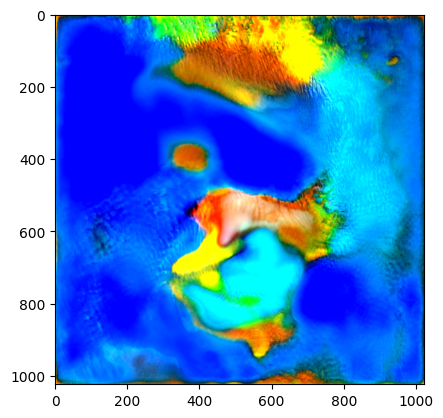

step 600
g(z1) - g(z) tensor(21.0919, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0030, device='cuda:0')
z1 - z tensor(1.9147, device='cuda:0')


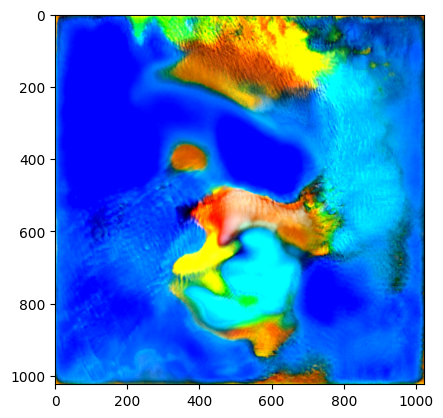

step 620
g(z1) - g(z) tensor(20.7930, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0032, device='cuda:0')
z1 - z tensor(1.9144, device='cuda:0')


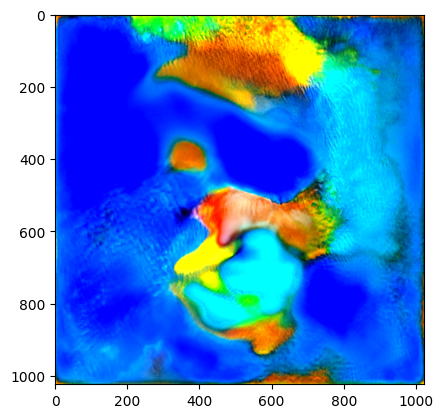

step 640
g(z1) - g(z) tensor(20.3061, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0033, device='cuda:0')
z1 - z tensor(1.9140, device='cuda:0')


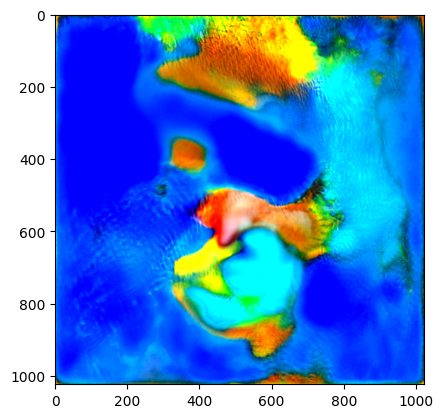

step 660
g(z1) - g(z) tensor(19.9849, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0035, device='cuda:0')
z1 - z tensor(1.9136, device='cuda:0')


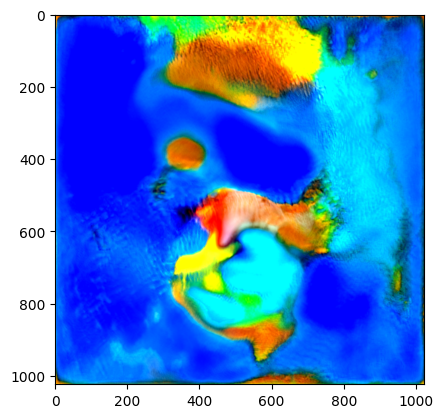

step 680
g(z1) - g(z) tensor(19.8604, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0037, device='cuda:0')
z1 - z tensor(1.9132, device='cuda:0')


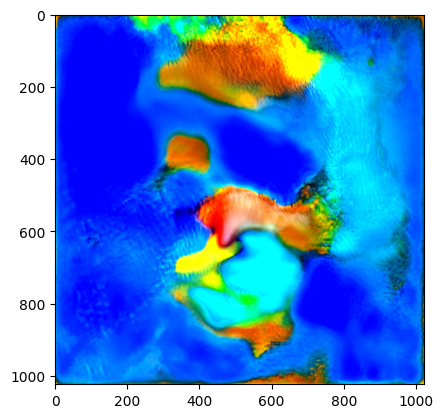

step 700
g(z1) - g(z) tensor(19.3052, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0039, device='cuda:0')
z1 - z tensor(1.9128, device='cuda:0')


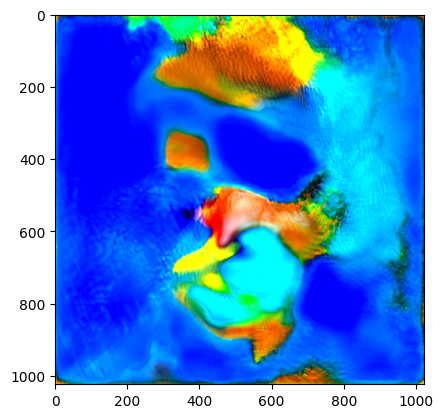

step 720
g(z1) - g(z) tensor(19.2571, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0041, device='cuda:0')
z1 - z tensor(1.9123, device='cuda:0')


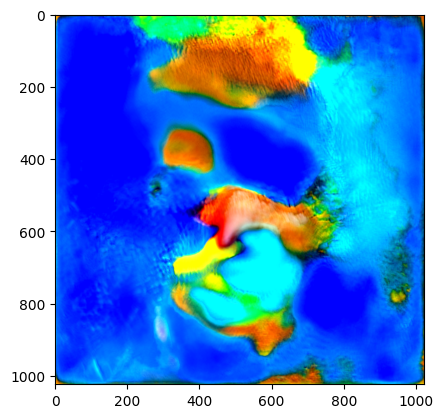

step 740
g(z1) - g(z) tensor(18.7424, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0042, device='cuda:0')
z1 - z tensor(1.9119, device='cuda:0')


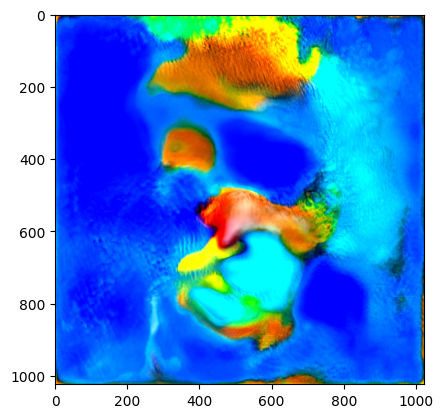

step 760
g(z1) - g(z) tensor(18.4103, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0044, device='cuda:0')
z1 - z tensor(1.9115, device='cuda:0')


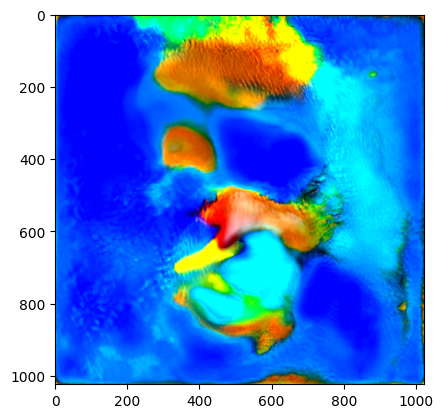

step 780
g(z1) - g(z) tensor(18.3025, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0046, device='cuda:0')
z1 - z tensor(1.9111, device='cuda:0')


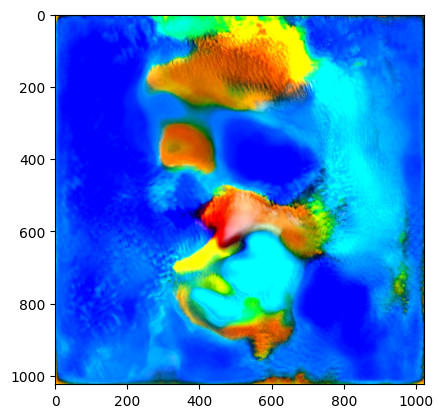

step 800
g(z1) - g(z) tensor(17.8937, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0048, device='cuda:0')
z1 - z tensor(1.9107, device='cuda:0')


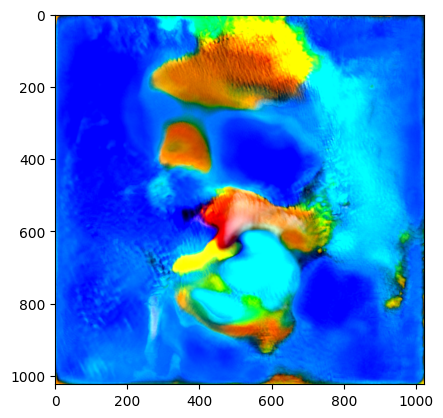

step 820
g(z1) - g(z) tensor(17.7839, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0049, device='cuda:0')
z1 - z tensor(1.9102, device='cuda:0')


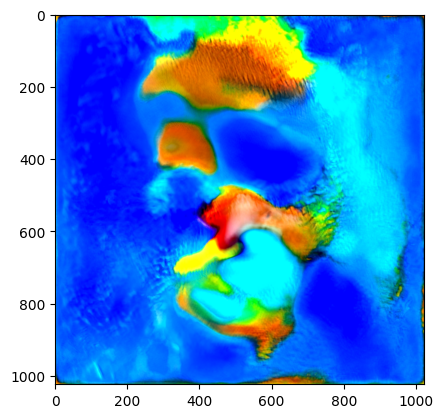

step 840
g(z1) - g(z) tensor(17.7268, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0051, device='cuda:0')
z1 - z tensor(1.9098, device='cuda:0')


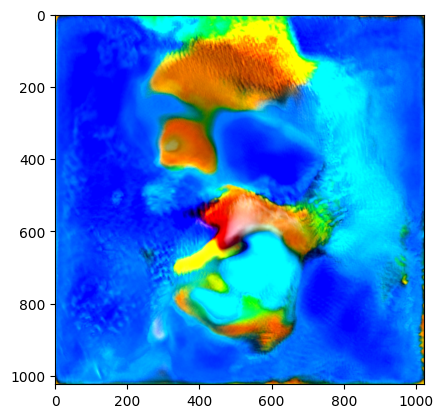

step 860
g(z1) - g(z) tensor(17.4110, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0053, device='cuda:0')
z1 - z tensor(1.9094, device='cuda:0')


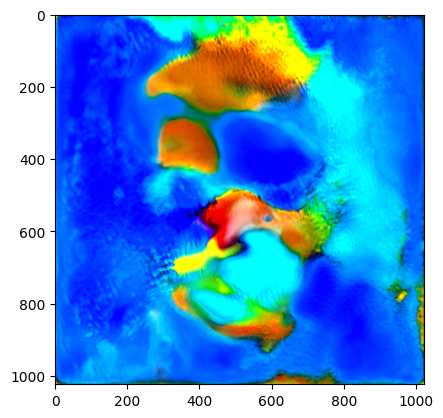

step 880
g(z1) - g(z) tensor(17.0681, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0054, device='cuda:0')
z1 - z tensor(1.9090, device='cuda:0')


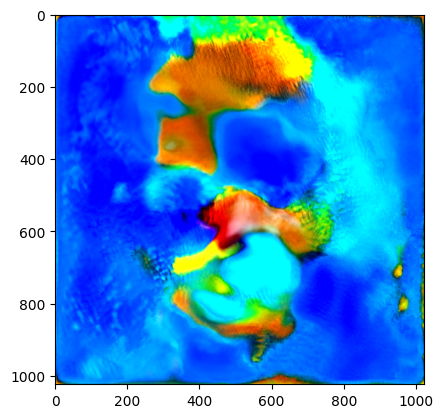

step 900
g(z1) - g(z) tensor(16.8613, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0056, device='cuda:0')
z1 - z tensor(1.9087, device='cuda:0')


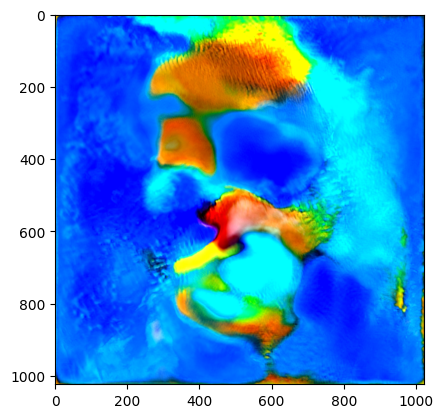

step 920
g(z1) - g(z) tensor(16.6733, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0058, device='cuda:0')
z1 - z tensor(1.9083, device='cuda:0')


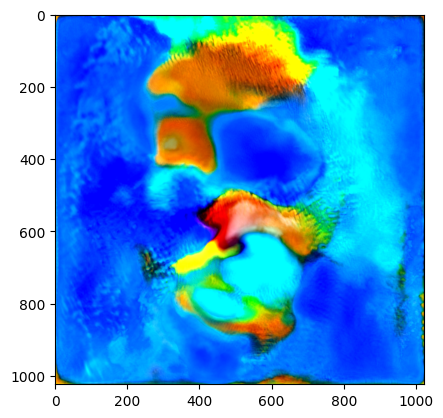

step 940
g(z1) - g(z) tensor(16.6813, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0059, device='cuda:0')
z1 - z tensor(1.9080, device='cuda:0')


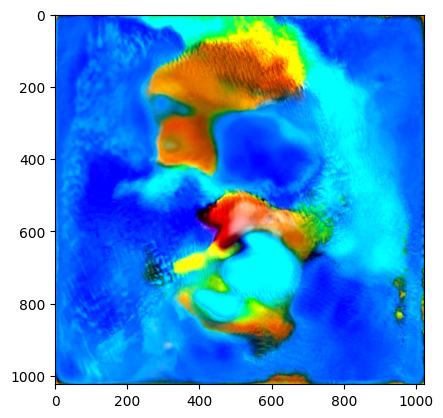

step 960
g(z1) - g(z) tensor(16.4101, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0061, device='cuda:0')
z1 - z tensor(1.9077, device='cuda:0')


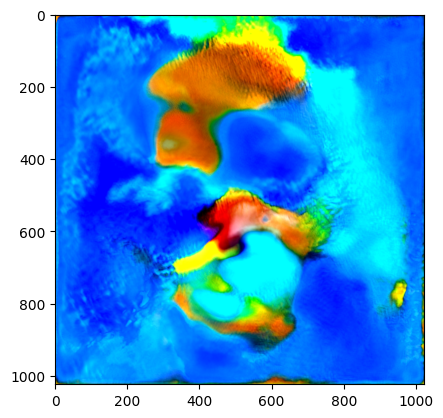

step 980
g(z1) - g(z) tensor(16.1254, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0062, device='cuda:0')
z1 - z tensor(1.9074, device='cuda:0')


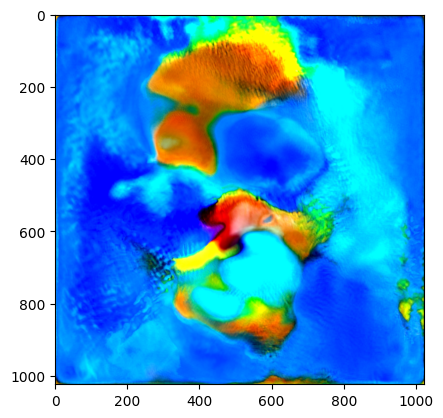

step 1000
g(z1) - g(z) tensor(16.3021, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0064, device='cuda:0')
z1 - z tensor(1.9071, device='cuda:0')


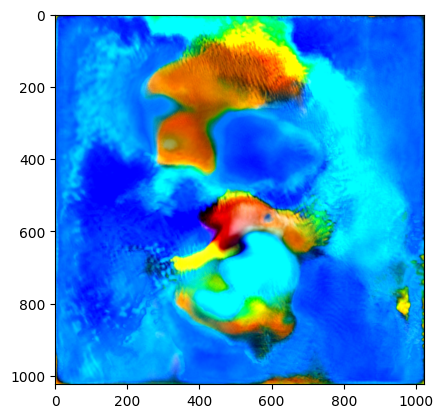

step 1020
g(z1) - g(z) tensor(16.1098, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0065, device='cuda:0')
z1 - z tensor(1.9068, device='cuda:0')


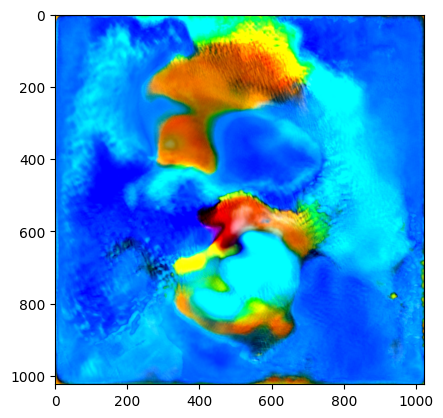

step 1040
g(z1) - g(z) tensor(15.8898, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0067, device='cuda:0')
z1 - z tensor(1.9065, device='cuda:0')


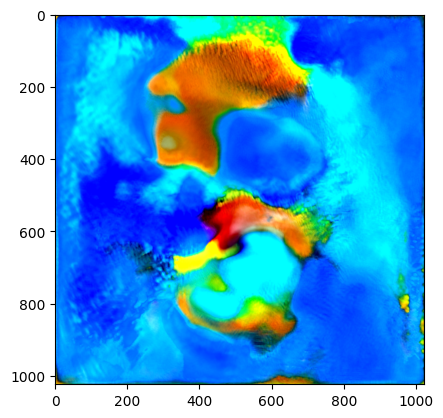

step 1060
g(z1) - g(z) tensor(15.8027, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0068, device='cuda:0')
z1 - z tensor(1.9063, device='cuda:0')


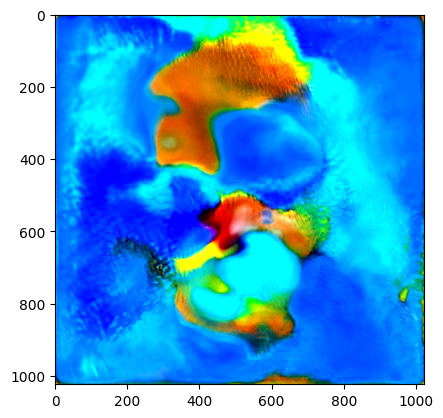

step 1080
g(z1) - g(z) tensor(15.7656, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0069, device='cuda:0')
z1 - z tensor(1.9060, device='cuda:0')


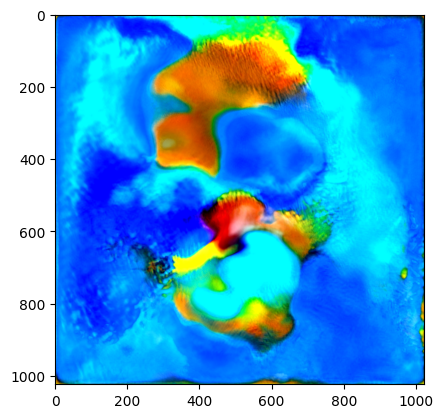

step 1100
g(z1) - g(z) tensor(15.4460, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0071, device='cuda:0')
z1 - z tensor(1.9058, device='cuda:0')


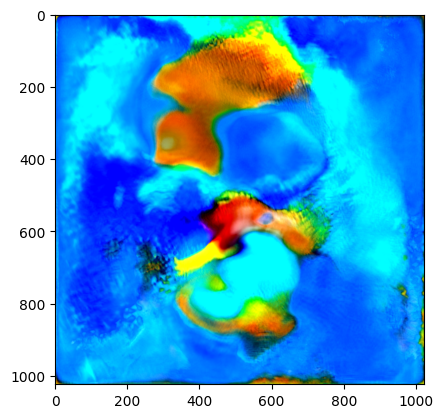

step 1120
g(z1) - g(z) tensor(15.4377, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0072, device='cuda:0')
z1 - z tensor(1.9055, device='cuda:0')


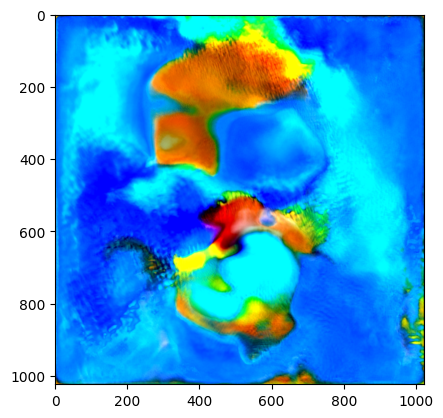

step 1140
g(z1) - g(z) tensor(15.5158, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0073, device='cuda:0')
z1 - z tensor(1.9053, device='cuda:0')


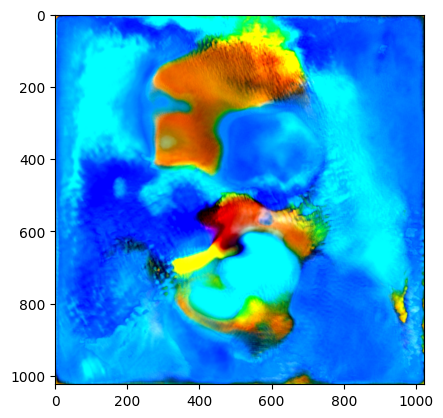

step 1160
g(z1) - g(z) tensor(15.1910, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0074, device='cuda:0')
z1 - z tensor(1.9050, device='cuda:0')


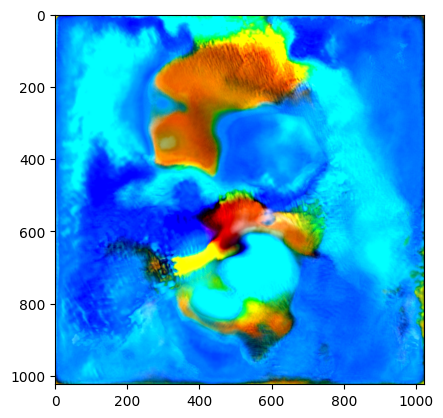

step 1180
g(z1) - g(z) tensor(15.2501, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0076, device='cuda:0')
z1 - z tensor(1.9048, device='cuda:0')


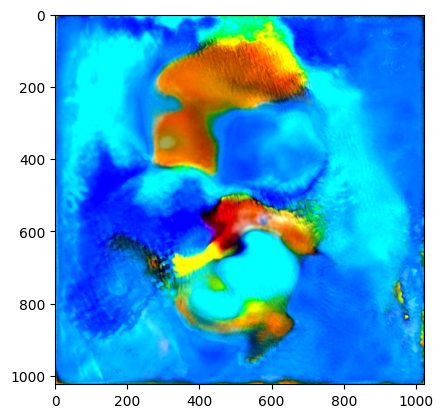

step 1200
g(z1) - g(z) tensor(14.9475, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0077, device='cuda:0')
z1 - z tensor(1.9046, device='cuda:0')


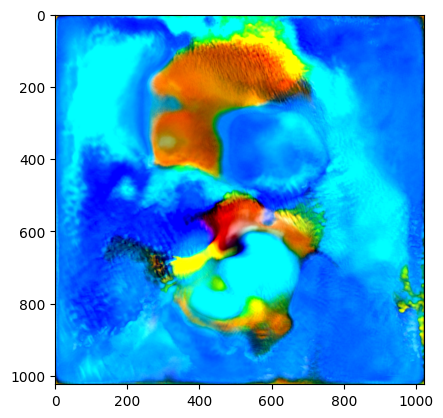

step 1220
g(z1) - g(z) tensor(15.0033, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0078, device='cuda:0')
z1 - z tensor(1.9043, device='cuda:0')


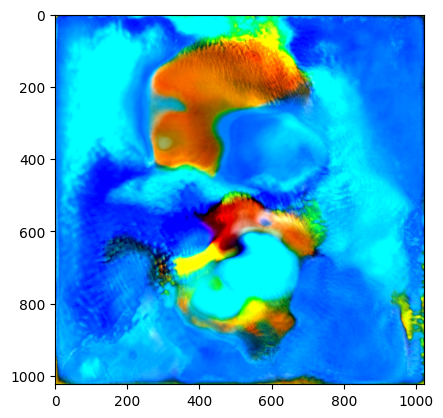

step 1240
g(z1) - g(z) tensor(14.9608, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0079, device='cuda:0')
z1 - z tensor(1.9041, device='cuda:0')


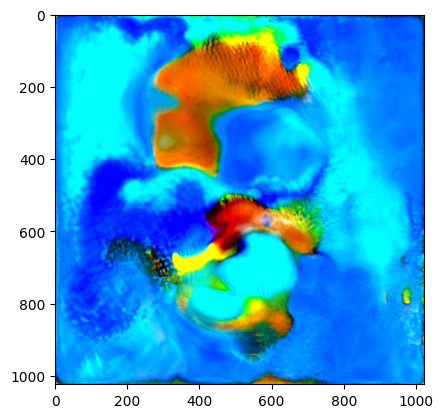

step 1260
g(z1) - g(z) tensor(14.9686, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0080, device='cuda:0')
z1 - z tensor(1.9039, device='cuda:0')


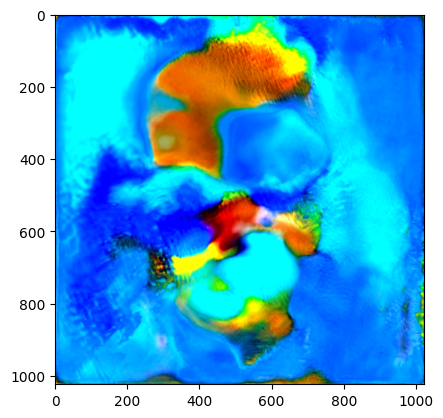

step 1280
g(z1) - g(z) tensor(14.7481, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0081, device='cuda:0')
z1 - z tensor(1.9037, device='cuda:0')


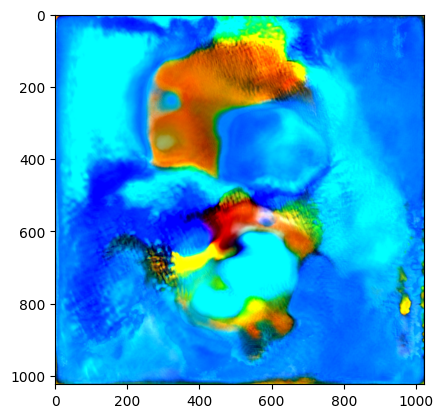

step 1300
g(z1) - g(z) tensor(14.6598, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0083, device='cuda:0')
z1 - z tensor(1.9035, device='cuda:0')


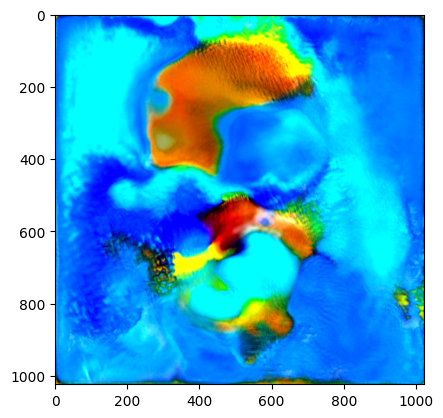

step 1320
g(z1) - g(z) tensor(14.6557, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0084, device='cuda:0')
z1 - z tensor(1.9033, device='cuda:0')


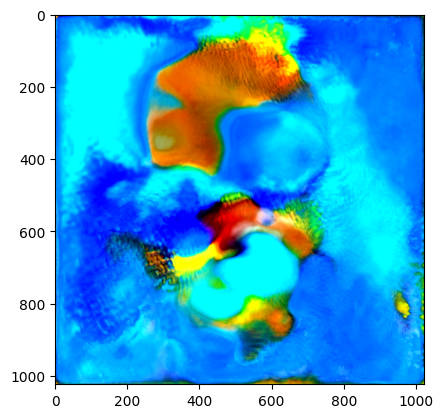

step 1340
g(z1) - g(z) tensor(14.5491, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0085, device='cuda:0')
z1 - z tensor(1.9031, device='cuda:0')


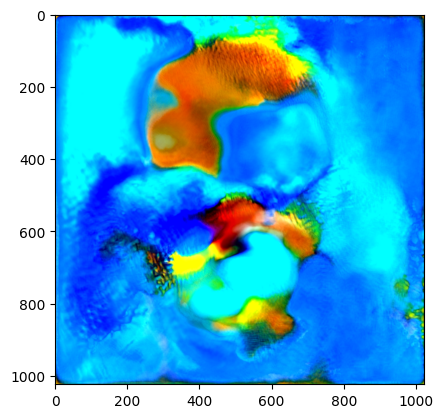

step 1360
g(z1) - g(z) tensor(14.7551, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0086, device='cuda:0')
z1 - z tensor(1.9028, device='cuda:0')


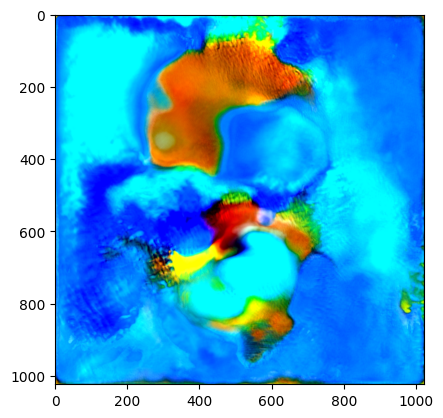

step 1380
g(z1) - g(z) tensor(14.4661, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0087, device='cuda:0')
z1 - z tensor(1.9027, device='cuda:0')


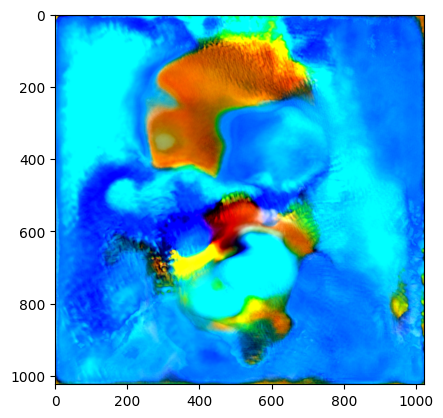

step 1400
g(z1) - g(z) tensor(14.4139, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0088, device='cuda:0')
z1 - z tensor(1.9025, device='cuda:0')


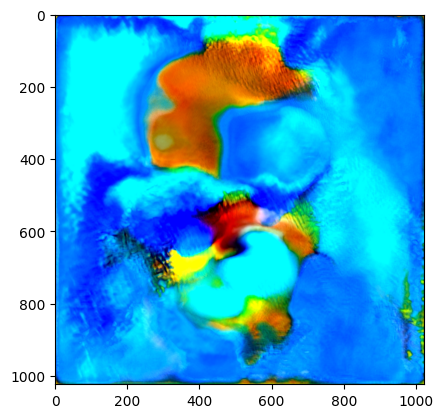

step 1420
g(z1) - g(z) tensor(14.3732, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0089, device='cuda:0')
z1 - z tensor(1.9023, device='cuda:0')


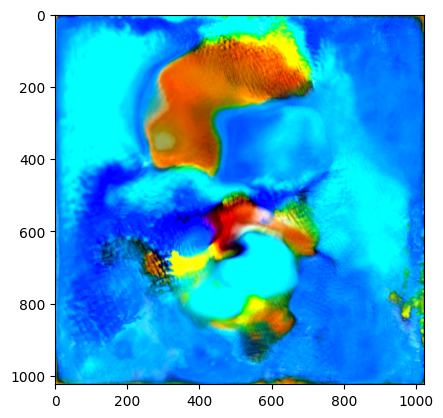

step 1440
g(z1) - g(z) tensor(14.3626, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0090, device='cuda:0')
z1 - z tensor(1.9022, device='cuda:0')


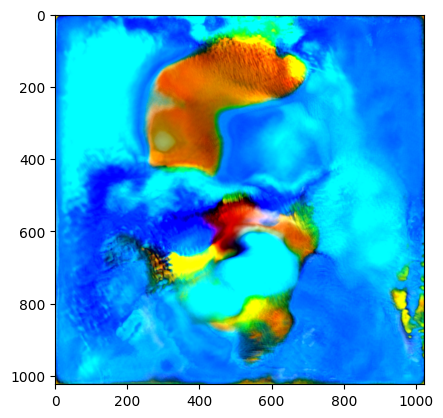

step 1460
g(z1) - g(z) tensor(14.2882, device='cuda:0', grad_fn=<MeanBackward0>)
z0 - z tensor(0.0091, device='cuda:0')
z1 - z tensor(1.9020, device='cuda:0')


KeyboardInterrupt: 

In [47]:
# Interpolating between two random images

numtrials = 1
for trialnum in range(numtrials):
  latent_d = args.latent
  numsteps = 10000
  learning_rate = 0.0001
  z0 = torch.randn([numtrials, latent_d]).to(device)
  # z1 = torch.randn([numtrials, latent_d]).to(device)
  z1 = z0 * math.sqrt(0) + torch.randn([numtrials, latent_d]).to(device) * math.sqrt(1)

  ptlist = []
  currz = torch.clone(z0)

  currz.requires_grad = True
  x1 = model_decode(g_ema, z1, args.truncation, mean_latent).detach() # g_ema is the name of the generator
  utils.save_image(
    x1,
    f"test.png",
    nrow=1,
    normalize=True,
    range=(-1, 1),
  )
  plt.imshow(cv2.imread('test.png')[:, :, ::-1])
  plt.show()

  optimizer = optim.Adam([currz], lr=learning_rate)
  pt_list = []
  for step in range(numsteps):
    ptlist.append(torch.clone(currz))
    currx = model_decode(g_ema, currz, args.truncation, mean_latent)
    loss = torch.mean((currx - x1)**2)
    # if loss < 0.02:
    #   break

    loss.backward()
    # print(currz.grad)

    if step % 20 == 0:

      with torch.no_grad():
        print('step',step)
        print('g(z1) - g(z)',loss)
        print('z0 - z',torch.mean((currz - z0)**2))
        print('z1 - z',torch.mean((currz - z1)**2))
      utils.save_image(
          currx,
          f"test.png",
          nrow=1,
          normalize=True,
          range=(-1, 1),
      )
      plt.imshow(cv2.imread('test.png')[:, :, ::-1])
      plt.show()

    optimizer.step()
    optimizer.zero_grad()
  
    # with torch.no_grad():
    #   currz = currz * torch.norm(z1) / torch.norm(currz)
    # # print(torch.norm(currz.grad,dim=1))
    # # print(currz.grad)
    # with torch.no_grad():
    #   graddir = currz.grad / torch.norm(currz.grad, dim=1).view(numtrials, 1)
    #   currz.add_(-graddir, alpha=step_size)

      # print(graddir)


    # z0grad = z0grad / torch.norm(z0grad,dim=1).view((numtrials,1))
    # print(currz)

In [48]:
torch.norm(z0)

tensor(22.4314, device='cuda:0')

In [49]:
torch.norm(z1)

tensor(21.7050, device='cuda:0')

In [50]:
delta = z1 - z0
deltac = currz - z0

In [51]:
deltau = delta / torch.norm(delta)
deltacu = deltac / torch.norm(deltac)

In [52]:
torch.sum(deltau * deltacu)

tensor(0.0844, device='cuda:0', grad_fn=<SumBackward0>)

In [53]:
torch.norm(currz)

tensor(22.4442, device='cuda:0', grad_fn=<CopyBackwards>)

In [54]:
# Interpolating between two random images

import torch.nn.functional as F
import torch.optim as optim
import math

numtrials = 1
for trialnum in range(numtrials):
  latent_d = args.latent
  numsteps = 100000
  learning_rate = 0.0001
  # z0 = torch.randn([numtrials, latent_d]).to(device)
  # # z1 = torch.randn([numtrials, latent_d]).to(device)
  # z1 = z0 * math.sqrt(0) + torch.randn([numtrials, latent_d]).to(device) * math.sqrt(1)

  ptlist = []
  # currz = torch.clone(z0)
  currz = torch.clone(oldcurrz.detach())

  currz.requires_grad = True
  x1 = model_decode(g_ema, z1, args.truncation, mean_latent).detach() # g_ema is the name of the generator
  utils.save_image(
    x1,
    f"test.png",
    nrow=1,
    normalize=True,
    range=(-1, 1),
  )
  plt.imshow(cv2.imread('test.png')[:, :, ::-1])
  plt.show()

  optimizer = optim.Adam([currz], lr=learning_rate)
  pt_list = []
  for step in range(numsteps):
    ptlist.append(torch.clone(currz))
    currx = model_decode(g_ema, currz, args.truncation, mean_latent)
    loss = torch.mean((currx - x1)**2)
    # if loss < 0.02:
    #   break

    loss.backward()
    # print(currz.grad)

    if step % 20 == 0:

      with torch.no_grad():
        print('step',step)
        print('g(z1) - g(z)',loss)
        print('z0 - z',torch.mean((currz - z0)**2))
        print('z1 - z',torch.mean((currz - z1)**2))
      utils.save_image(
          currx,
          f"test.png",
          nrow=1,
          normalize=True,
          range=(-1, 1),
      )
      plt.imshow(cv2.imread('test.png')[:, :, ::-1])
      plt.show()

    optimizer.step()
    optimizer.zero_grad()
  
    # with torch.no_grad():
    #   currz = currz * torch.norm(z1) / torch.norm(currz)
    # # print(torch.norm(currz.grad,dim=1))
    # # print(currz.grad)
    # with torch.no_grad():
    #   graddir = currz.grad / torch.norm(currz.grad, dim=1).view(numtrials, 1)
    #   currz.add_(-graddir, alpha=step_size)

      # print(graddir)


    # z0grad = z0grad / torch.norm(z0grad,dim=1).view((numtrials,1))
    # print(currz)

NameError: name 'oldcurrz' is not defined

In [ ]:
oldcurrz = torch.clone(currz)

In [ ]:
def show_img(currx):
  utils.save_image(
    currx,
    f"test.png",
    nrow=1,
    normalize=True,
    range=(-1, 1),
  )
  plt.imshow(cv2.imread('test.png')[:, :, ::-1])
  plt.show()

In [ ]:
import math
discretization = 10
with torch.no_grad():
  for i in range(discretization):
    t = i / ((discretization - 1))
    interpz = z0 * math.sqrt(1 - t**2) + z1 * t
    # interpz = currz * math.sqrt(1 - t**2) + z1 * t
    print(torch.mean((interpz - currz)**2))
    currx = model_decode(g_ema, interpz, args.truncation, mean_latent)
    show_img(currx)

In [ ]:
currz.shape

In [ ]:
plt.hist(np.asarray(currz.detach().cpu()))

In [ ]:
plt.hist(np.asarray(currz.detach().cpu()[0,:]),bins=50)

In [ ]:
plt.hist(np.asarray(z0.detach().cpu()[0,:]),bins=50)

**George:** Use Langevin diffusion to sample the level sets of the generator function g(z) = c. Even though g(z) is a stochastic function (some layers have added noise) the variance of g(z) should still be small so studying its level sets should be fine.

In [ ]:
# Interpolating between two random images

import torch.nn.functional as F
import torch.optim as optim
import math

numtrials = 1
for trialnum in range(numtrials):
  latent_d = args.latent
  numsteps = 10000
  learning_rate = 0.0001
  z0 = torch.randn([numtrials, latent_d]).to(device)
  # z1 = torch.randn([numtrials, latent_d]).to(device)
  z1 = z0 * math.sqrt(0) + torch.randn([numtrials, latent_d]).to(device) * math.sqrt(1)

  ptlist = []
  currz = torch.clone(z0)

  currz.requires_grad = True
  x1 = model_decode(g_ema, z1, args.truncation, mean_latent).detach() # g_ema is the name of the generator
  utils.save_image(
    x1,
    f"test.png",
    nrow=1,
    normalize=True,
    range=(-1, 1),
  )
  plt.imshow(cv2.imread('test.png')[:, :, ::-1])
  plt.show()

  optimizer = optim.Adam([currz], lr=learning_rate)
  pt_list = []
  for step in range(numsteps):
    ptlist.append(torch.clone(currz))
    currx = model_decode(g_ema, currz, args.truncation, mean_latent)
    loss = torch.mean((currx - x1)**2)
    # if loss < 0.02:
    #   break

    loss.backward()
    # print(currz.grad)

    if step % 20 == 0:

      with torch.no_grad():
        print('step',step)
        print('g(z1) - g(z)',loss)
        print('z0 - z',torch.mean((currz - z0)**2))
        print('z1 - z',torch.mean((currz - z1)**2))
      utils.save_image(
          currx,
          f"test.png",
          nrow=1,
          normalize=True,
          range=(-1, 1),
      )
      plt.imshow(cv2.imread('test.png')[:, :, ::-1])
      plt.show()

    optimizer.step()
    optimizer.zero_grad()

**George:** Study how well an epsilon box around randomly sampled z's in the latent space cover the space of [-1, 1]^{3x1024x1024} images.

In [56]:
latent_d = args.latent
print(latent_d)

decode = lambda z : model_decode(g_ema, z, args.truncation, mean_latent).detach()

# First study how isotropic the Gram matrices of the Jacobians are at random points.
# This should tell us if there are a few directions of large change in the output image.
trials = 100
conds = []
lmaxs = []
lmins = []
for i in range(trials):
  print(i)
  z = torch.randn([1, latent_d]).to(device)
  Jg = compute_jacobian(decode, z).view(-1, latent_d)
  G = torch.matmul(Jg.t(), Jg)

  cond = torch.linalg.cond(G).item()
  lmax = torch.lobpcg(G)[0].item()
  lmin = torch.lobpcg(G, largest=False)[0].item()

  conds.append(cond)
  lmaxs.append(lmax)
  lmins.append(lmin)

#eps = 1e-6
#mean = torch.zeros([num_samples, latent_d]).to(device)
#zs = eps * (mean + torch.randn([num_samples, latent_d]).to(device) - 0.5)
#
#xs = model_decode(g_ema, zs).detach()
#
#
#print(xs.shape)
#x0 = xs[0, :, :, :]
#print(x0)
#utils.save_image(
#    x0,
#    f"test.png",
#    nrow=1,
#    normalize=True,
#    range=(-1, 1),
#  )
#plt.imshow(cv2.imread('test.png')[:, :, ::-1])
#plt.show()

512
0


RuntimeError: invalid argument 1: A should not be empty at /pytorch/aten/src/TH/generic/THTensorLapack.cpp:356

In [ ]:
y = torch.zeros((3, 1024, 1024, 512))

In [ ]:
f = lambda z : with torch.no_grad(): model_decode(g_ema, z, args.truncation, mean_latent).detach()
latent_d = args.latent
z = torch.randn([1, latent_d]).to(device)
fz = f(z).squeeze()
z = z.squeeze()
n = fz.size()
d = z.size()
print(tuple(n) + tuple(d))
J = np.zeros(tuple(n) + tuple(d))

## Sampling random standard Gaussian latent w generates monsters

In [ ]:
latent_d = args.latent
w = torch.randn([1, latent_d]).to(device)
x = model_decode(g_ema, w, args.truncation, mean_latent).detach()

utils.save_image(
    x,
    f"test.png",
    nrow=1,
    normalize=True,
    range=(-1, 1),
  )
plt.imshow(cv2.imread('test.png')[:, :, ::-1])
plt.show()